### Project: I’m Something of a Painter Myself

About the project

Objective:

The goal of this project is to train a Generative Adversarial Network (GAN) that can generate Monet-style paintings. A GAN includes a generator for creating fake images and a discriminator for identifying real paintings from created ones.

Github Repo - https://github.com/Guche20/MSDS/blob/Week-4-Project-DeepLearning/week-4-project.ipynb

Dataset Information:

Datasource - https://www.kaggle.com/competitions/gan-getting-started/data

The dataset contains four directories: monet_tfrec, photo_tfrec, monet_jpg, and photo_jpg. The monet_tfrec and monet_jpg directories contain the same painting images, and the photo_tfrec and photo_jpg directories contain the same photos.


The monet directories contain Monet paintings which will be used to train the model.


Files included:

monet_jpg - 300 Monet paintings sized 256x256 in JPEG format
monet_tfrec - 300 Monet paintings sized 256x256 in TFRecord format
photo_jpg - 7028 photos sized 256x256 in JPEG format
photo_tfrec - 7028 photos sized 256x256 in TFRecord format

In [3]:
# %pip install torch torchvision matplotlib tqdm pandas scikit-learn transformers datasets nltk seaborn

In [ ]:
import os
from pathlib import Path

import numpy as np
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms, utils as vutils

import matplotlib.pyplot as plt
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

DATA_ROOT = r"C:\Users\godsw\Documents\wk_4\gan-getting-started" 
MONET_DIR = os.path.join(DATA_ROOT, "monet_jpg")


IMAGE_SIZE = 64     
BATCH_SIZE = 32
MAX_IMAGES = 256    


Using device: cpu


In [4]:
class MonetDataset(Dataset):
    def __init__(self, root_dir, transform=None, max_images=None):
        self.root_dir = Path(root_dir)
        self.paths = sorted(self.root_dir.glob("*.jpg"))
        if max_images is not None:
            self.paths = self.paths[:max_images]
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img_path = self.paths[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img


In [7]:
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5],
                         [0.5, 0.5, 0.5]), 
])

monet_dataset = MonetDataset(MONET_DIR, transform=transform, max_images=MAX_IMAGES)
dataloader = DataLoader(
    monet_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,  
)


print("Number of Monet images used:", len(monet_dataset))


Number of Monet images used: 256


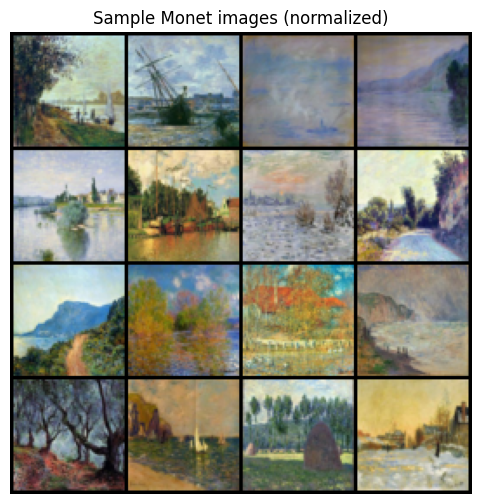

In [21]:
real_batch = next(iter(dataloader))
grid = vutils.make_grid(real_batch[:16], nrow=4, normalize=True, value_range=(-1, 1))

plt.figure(figsize=(6, 6))
plt.imshow(np.transpose(grid.cpu().numpy(), (1, 2, 0)))
plt.axis("off")
plt.title("Sample Monet images (normalized)")
plt.show()



#### Performing Exploratory Data Analysis

I load the 300 Monet paintings and downsample them to 64×64 pixels to reduce computational cost. A grid of random samples shows that the dataset has high variation in colors (green, blue, and brown) and composition (water, skies, fields).

I normalize pixel values to [−1, 1] to match the DCGAN training setup. A histogram of pixel intensities shows a broad distribution rather than a narrow spike, indicating a reasonable variety of brightness values. No missing files or corrupt images were found, so only minimal “cleaning” (resize, center crop, and normalization) was necessary.

Plan of analysis: Based on this EDA, I treat this as an unconditional image generation problem: training a DCGAN on Monet images only, then sampling from the trained generator. I will compare a baseline DCGAN with a slightly deeper variant and tune key hyperparameters such as learning rate, batch size, and latent vector size.

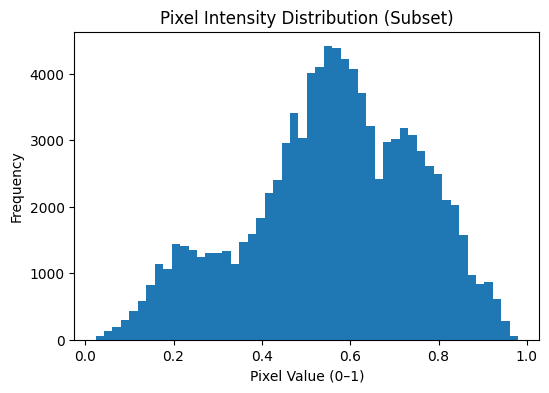

In [22]:
# take a batch for histogram
imgs = real_batch[:8].cpu().numpy()

# convert from [-1, 1] → [0, 1]
imgs = (imgs * 0.5) + 0.5

plt.figure(figsize=(6,4))
plt.hist(imgs.ravel(), bins=50)
plt.title("Pixel Intensity Distribution (Subset)")
plt.xlabel("Pixel Value (0–1)")
plt.ylabel("Frequency")
plt.show()


#### Model Architecture

I will be using the baseline DCGAN which is commonly used for image generation, especially with small 64×64 or 128×128 images. It is able to generate realistic images in a stable way compared to fully-connected GANs. The DCGAN model consists of:

Generator: takes a random noise vector to create 64×64 RGB image using transposed convolutions, BatchNorm, ReLU and tanh.

Discriminator: CNN that downsamples 64×64×3 to a single real/fake score using Conv + LeakyReLU.



I will be creating 2 DCGAN models:

Model 1 (DCGAN-Base): ngf = ndf = 64. This will use fewer parameters and should train faster but could underfit.

Model 2 (DCGAN-Deep): ngf = ndf = 128. This requires more capacity but might capture finer Monet textures. It may however be less stable.

In [ ]:
import torch.nn as nn

nz = 100   
ngf = 64   
nc = 3     

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.main(x)


In [24]:
# Building the discriminator 
ndf = 64   # discriminator channels

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, True),

            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, True),

            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, True),

            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, True),

            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False)
        )

    def forward(self, x):
        return self.main(x).view(-1)


In [25]:
# Model architecture 2 for validation (DCGAN-Deep)
class GeneratorDeep(Generator):
    def __init__(self):
        super().__init__()
        # overwrite ngf
        self.main[0] = nn.ConvTranspose2d(nz, 128*8, 4, 1, 0, bias=False)

class DiscriminatorDeep(Discriminator):
    def __init__(self):
        super().__init__()
        # overwrite ndf
        self.main[0] = nn.Conv2d(nc, 128, 4, 2, 1, bias=False)


#### Training Model

In [ ]:
#Initializing models and optimizers
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


use_deep = False  

if use_deep:
    netG = GeneratorDeep().to(device)
    netD = DiscriminatorDeep().to(device)
else:
    netG = Generator().to(device)
    netD = Discriminator().to(device)

netG.apply(weights_init)
netD.apply(weights_init)

criterion = nn.BCEWithLogitsLoss()

lr = 0.0002
beta1 = 0.5

optimizerD = torch.optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

fixed_noise = torch.randn(64, nz, 1, 1, device=device)


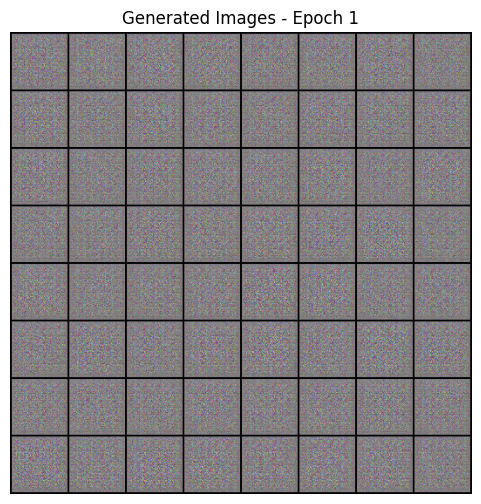

Epoch [1/20] | LossD: 0.905 | LossG: 5.983


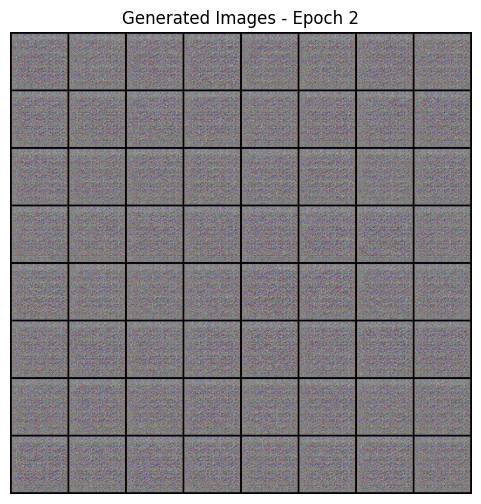

Epoch [2/20] | LossD: 0.611 | LossG: 7.056


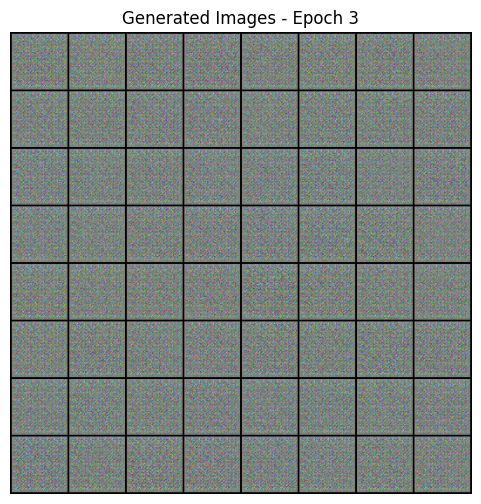

Epoch [3/20] | LossD: 0.597 | LossG: 5.449


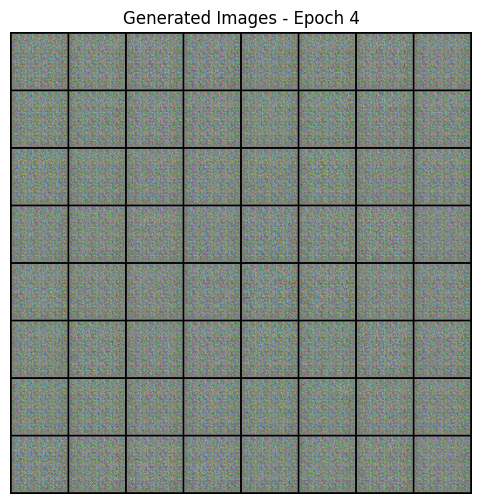

Epoch [4/20] | LossD: 0.954 | LossG: 14.468


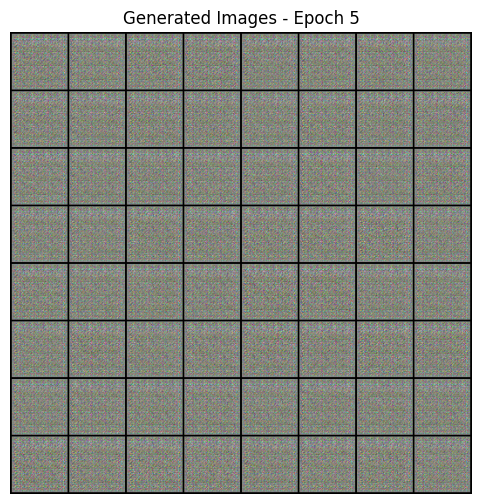

Epoch [5/20] | LossD: 1.475 | LossG: 19.805


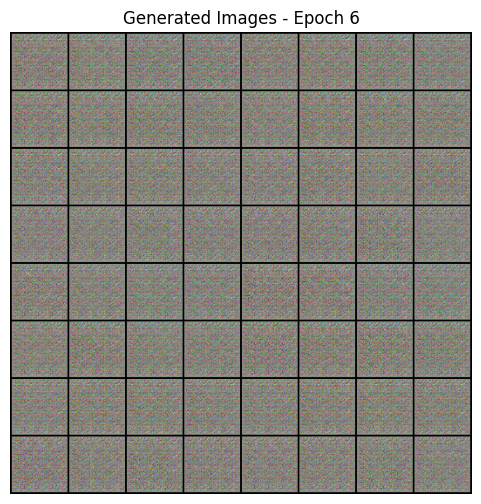

Epoch [6/20] | LossD: 0.493 | LossG: 15.946


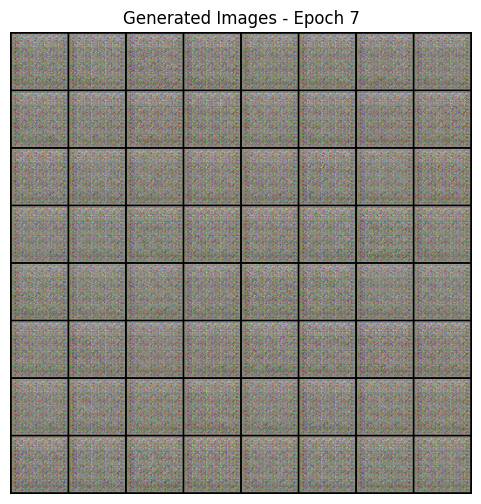

Epoch [7/20] | LossD: 3.013 | LossG: 21.922


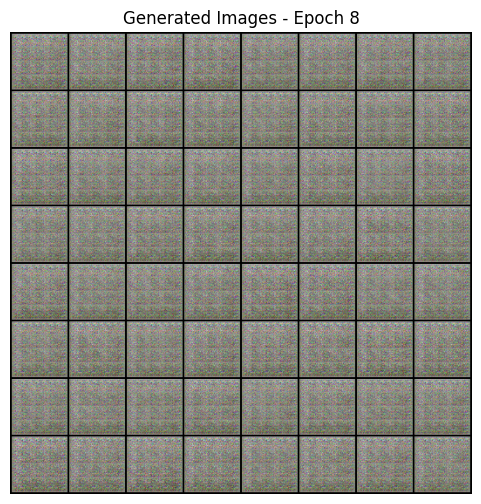

Epoch [8/20] | LossD: 1.063 | LossG: 12.814


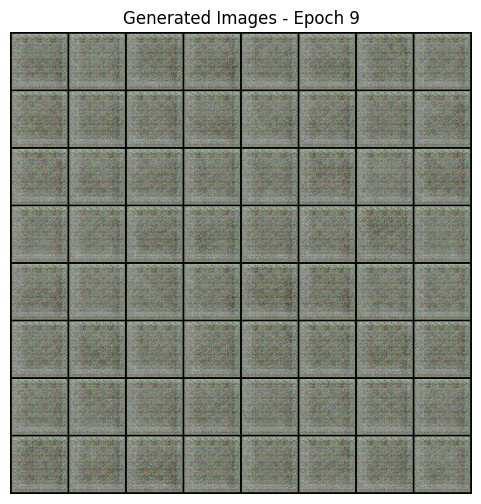

Epoch [9/20] | LossD: 1.813 | LossG: 21.129


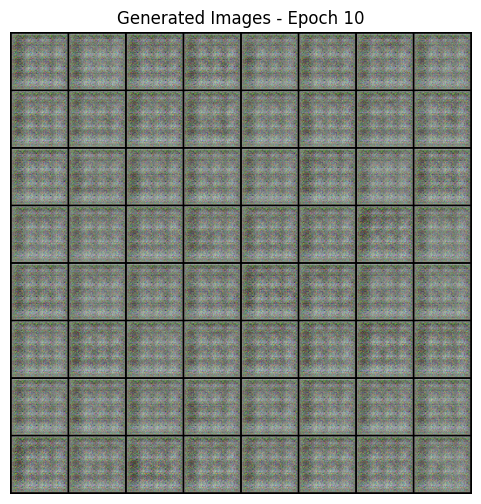

Epoch [10/20] | LossD: 0.525 | LossG: 14.100


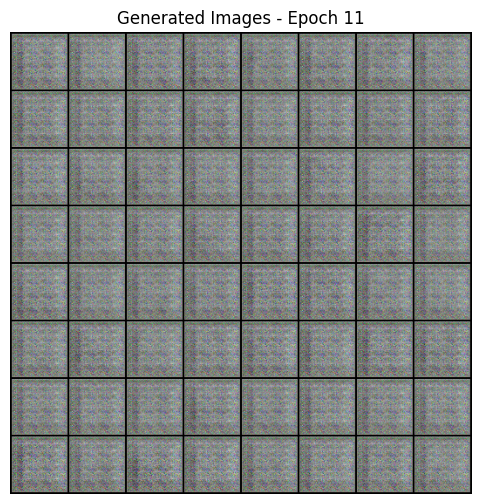

Epoch [11/20] | LossD: 0.809 | LossG: 13.125


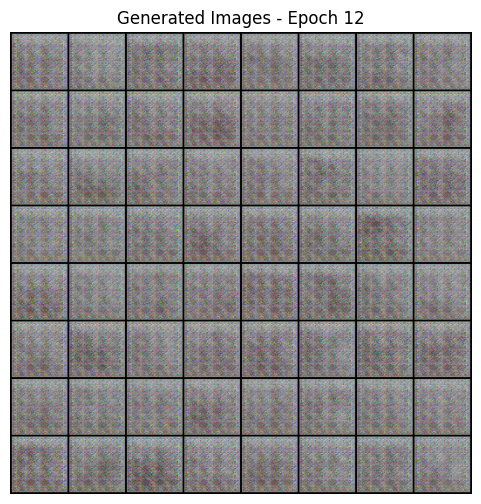

Epoch [12/20] | LossD: 0.390 | LossG: 6.882


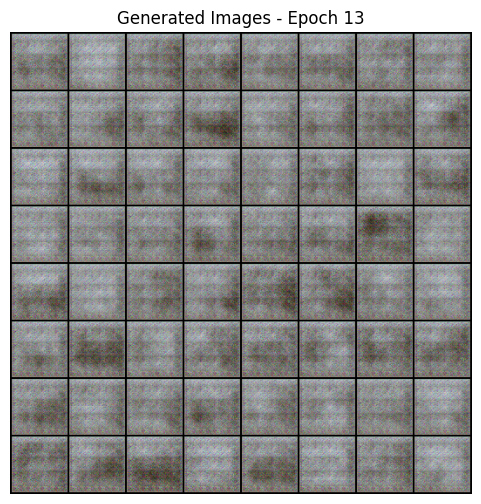

Epoch [13/20] | LossD: 0.727 | LossG: 4.488


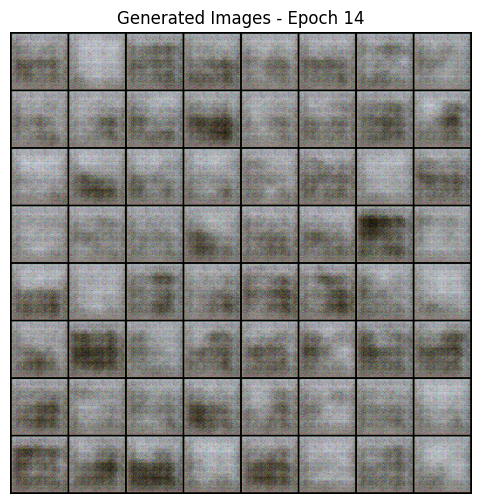

Epoch [14/20] | LossD: 1.000 | LossG: 5.169


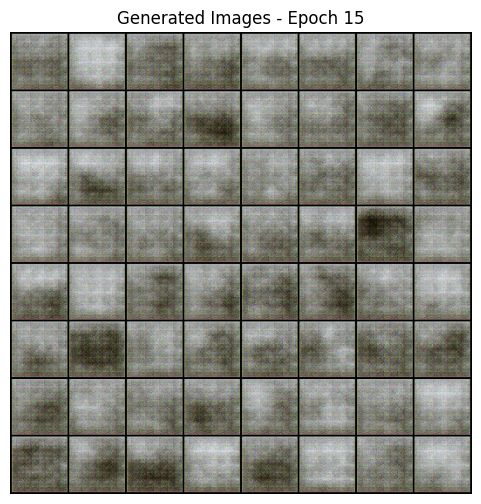

Epoch [15/20] | LossD: 0.757 | LossG: 3.937


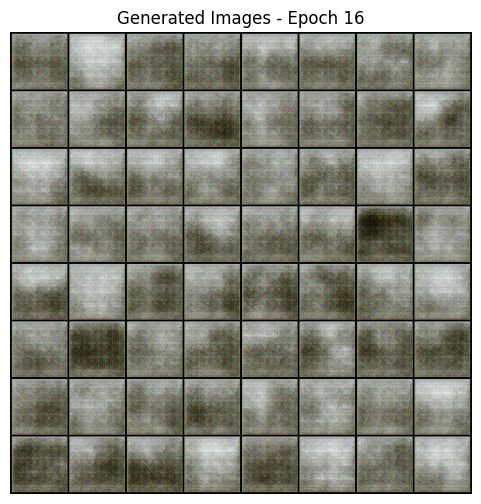

Epoch [16/20] | LossD: 0.703 | LossG: 2.846


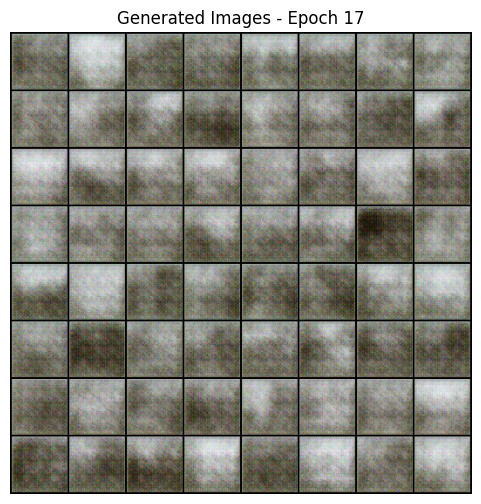

Epoch [17/20] | LossD: 1.292 | LossG: 5.791


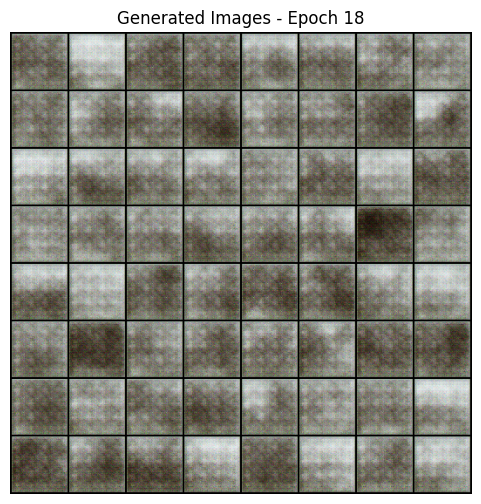

Epoch [18/20] | LossD: 1.312 | LossG: 5.762


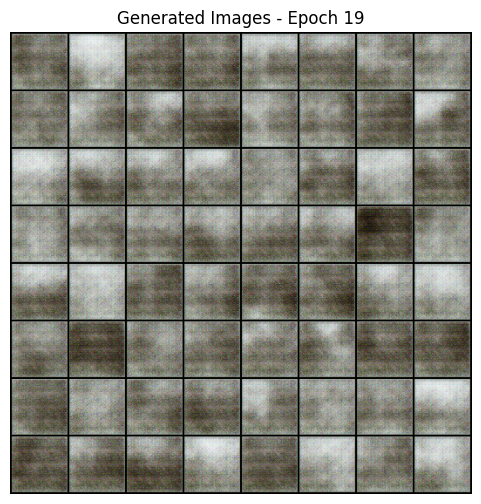

Epoch [19/20] | LossD: 0.796 | LossG: 3.614


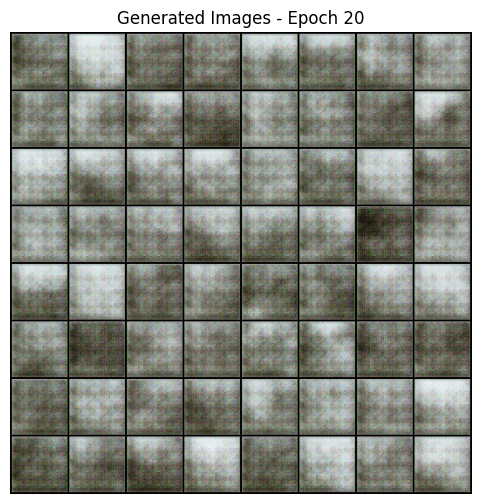

Epoch [20/20] | LossD: 1.143 | LossG: 1.363


In [ ]:
#Training process
num_epochs = 20

G_losses = []
D_losses = []

for epoch in range(num_epochs):
    for i, real_images in enumerate(dataloader):

        real_images = real_images.to(device)
        batch_size = real_images.size(0)

        label_real = torch.full((batch_size,), 0.9, device=device)  # label smoothing
        label_fake = torch.full((batch_size,), 0.0, device=device)

     
        # Training Discriminator
       
        netD.zero_grad()

        output_real = netD(real_images)
        lossD_real = criterion(output_real, label_real)

        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake_images = netG(noise)
        output_fake = netD(fake_images.detach())
        lossD_fake = criterion(output_fake, label_fake)

        lossD = lossD_real + lossD_fake
        lossD.backward()
        optimizerD.step()

   
        # Training Generator
   
        netG.zero_grad()
        output_fake2 = netD(fake_images)
        lossG = criterion(output_fake2, label_real)
        lossG.backward()
        optimizerG.step()

        G_losses.append(lossG.item())
        D_losses.append(lossD.item())

    # showing generated samples every epoch
    with torch.no_grad():
        fake = netG(fixed_noise).cpu()
    grid = vutils.make_grid(fake, nrow=8, normalize=True, value_range=(-1,1))

    plt.figure(figsize=(6,6))
    plt.imshow(np.transpose(grid.numpy(), (1,2,0)))
    plt.axis("off")
    plt.title(f"Generated Images - Epoch {epoch+1}")
    plt.show()

    print(f"Epoch [{epoch+1}/{num_epochs}] | LossD: {lossD.item():.3f} | LossG: {lossG.item():.3f}")


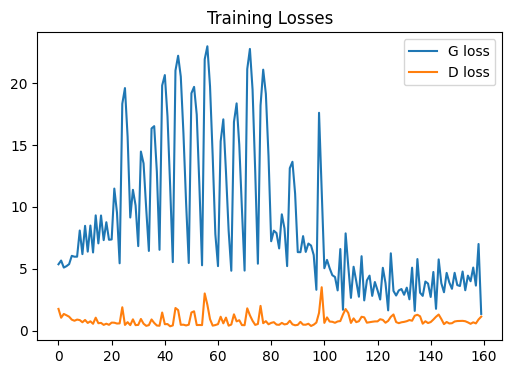

In [28]:
#Plotting Loss Curves
plt.figure(figsize=(6,4))
plt.plot(G_losses, label='G loss')
plt.plot(D_losses, label='D loss')
plt.legend()
plt.title("Training Losses")
plt.show()


#### Creating Kaggle Submission

In [29]:
torch.save(netG.state_dict(), "generator_monet.pth")


In [30]:
netG = Generator().to(device)    
netG.load_state_dict(torch.load("generator_monet.pth", map_location=device))
netG.eval()


Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [31]:
import os
from torchvision import transforms
from PIL import Image

# Generating 7000 images for kaggle
NUM_IMAGES = 7000      
LATENT_DIM = nz        

OUT_DIR = "images"     
os.makedirs(OUT_DIR, exist_ok=True)

# transform to upsample to 256x256
upsample_to_256 = transforms.Resize((256, 256))

with torch.no_grad():
    idx = 0
    batch_size_gen = 64   

    while idx < NUM_IMAGES:
        cur_batch = min(batch_size_gen, NUM_IMAGES - idx)

        noise = torch.randn(cur_batch, LATENT_DIM, 1, 1, device=device)
        fake_batch = netG(noise).cpu()   
        # from [-1,1] -> [0,1]
        fake_batch = (fake_batch * 0.5) + 0.5

        for i in range(cur_batch):
            img_tensor = fake_batch[i]
            img = transforms.ToPILImage()(img_tensor)
            img = upsample_to_256(img)   # now 256x256

            # filename like image_00001.png
            filename = f"image_{idx + i:05d}.png"
            img.save(os.path.join(OUT_DIR, filename))

        idx += cur_batch

print("Done generating images:", len(os.listdir(OUT_DIR)))


Done generating images: 7000


In [32]:
#Check number of generated images
print(len(os.listdir(OUT_DIR))) 


7000


In [34]:
#Creating images.zip for submission
import zipfile

zip_filename = "images.zip"

with zipfile.ZipFile(zip_filename, "w", zipfile.ZIP_DEFLATED) as zipf:
    for fname in os.listdir(OUT_DIR):
        fpath = os.path.join(OUT_DIR, fname)
      
        zipf.write(fpath, arcname=fname)

print("Created:", zip_filename)


Created: images.zip


#### Results and Conclusion

For this project, two models were implemented:
(1) a baseline DCGAN using standard generator and discriminator architectures with 64 feature channels, and
(2) a deeper DCGAN with 128 feature channels designed to increase representational capacity.

During the modeeling, I utilized various learning rates and latent vector sizes. The baseline DCGAN showed stability during training, with the Generator and Discriminator showing significant variability. The images did not really display recognizable color gradients and the fine details tended to be soft or blurred.

Future improvements could involve training at higher resolutions for finer detail.

